<a href="https://colab.research.google.com/github/Anipro-10/Deep-Learning-based-Metal-Scrap-Classification/blob/main/Scrap_Classifier_2_with_augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
anirudh04prakash_scrap_data_path = kagglehub.dataset_download('anirudh04prakash/scrap-data')

print('Data source import complete.')


In [ ]:
import numpy as np
import tensorflow as tf
import os
import matplotlib.pyplot as plt

In [ ]:
img_height = 224
img_width = 224
batch_size = 32

In [ ]:
def load_and_label_images(directory):
    image_paths = []
    labels = []
    class_names = sorted([d for d in os.listdir(directory)
                          if not d.startswith('.') and os.path.isdir(os.path.join(directory, d))])# and d!='brass'])

    print(f"Classes found: {class_names}")

    for class_index, class_name in enumerate(class_names):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                if img_path.lower().endswith(('png', 'jpg', 'jpeg')):
                    image_paths.append(img_path)
                    labels.append(class_index)

    return np.array(image_paths), np.array(labels), class_names

In [ ]:
train_paths, train_labels, class_names = load_and_label_images('/kaggle/input/scrap-data/scrap/train')
test_paths, test_labels, _ = load_and_label_images('/kaggle/input/scrap-data/scrap/test')

Classes found: ['aluminium', 'brass', 'copper', 'steel']
Classes found: ['aluminium', 'brass', 'copper', 'steel']


In [ ]:
train_labels = tf.keras.utils.to_categorical(train_labels, num_classes=len(class_names))
test_labels = tf.keras.utils.to_categorical(test_labels, num_classes=len(class_names))

In [ ]:
print("Number of training samples:", len(train_paths))
print("Number of test samples:", len(test_paths))
print("Classes:", class_names)

Number of training samples: 1105
Number of test samples: 86
Classes: ['aluminium', 'brass', 'copper', 'steel']


In [ ]:
SEED = 123

In [ ]:
def load_and_preprocess_image(path, label):
    img = tf.io.read_file(path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [img_height, img_width])
    img = tf.cast(img, tf.float32) / 255.0
    return img, label

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2)),
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(0.001),
    tf.keras.layers.GaussianNoise(0.1)
])

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
train_dataset = train_dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(buffer_size=len(train_paths), seed=SEED)
train_dataset = train_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

train_dataset_augmented = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
train_dataset_augmented = train_dataset_augmented.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset_augmented = train_dataset_augmented.map(lambda x, y: (data_augmentation(x, training=True), y),num_parallel_calls=tf.data.AUTOTUNE)
train_dataset_augmented = train_dataset_augmented.shuffle(buffer_size=len(train_paths), seed=SEED)
train_dataset_augmented = train_dataset_augmented.batch(batch_size).prefetch(tf.data.AUTOTUNE)

In [ ]:
test_dataset = tf.data.Dataset.from_tensor_slices((test_paths, test_labels))
test_dataset = test_dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

Images before augmentation: 


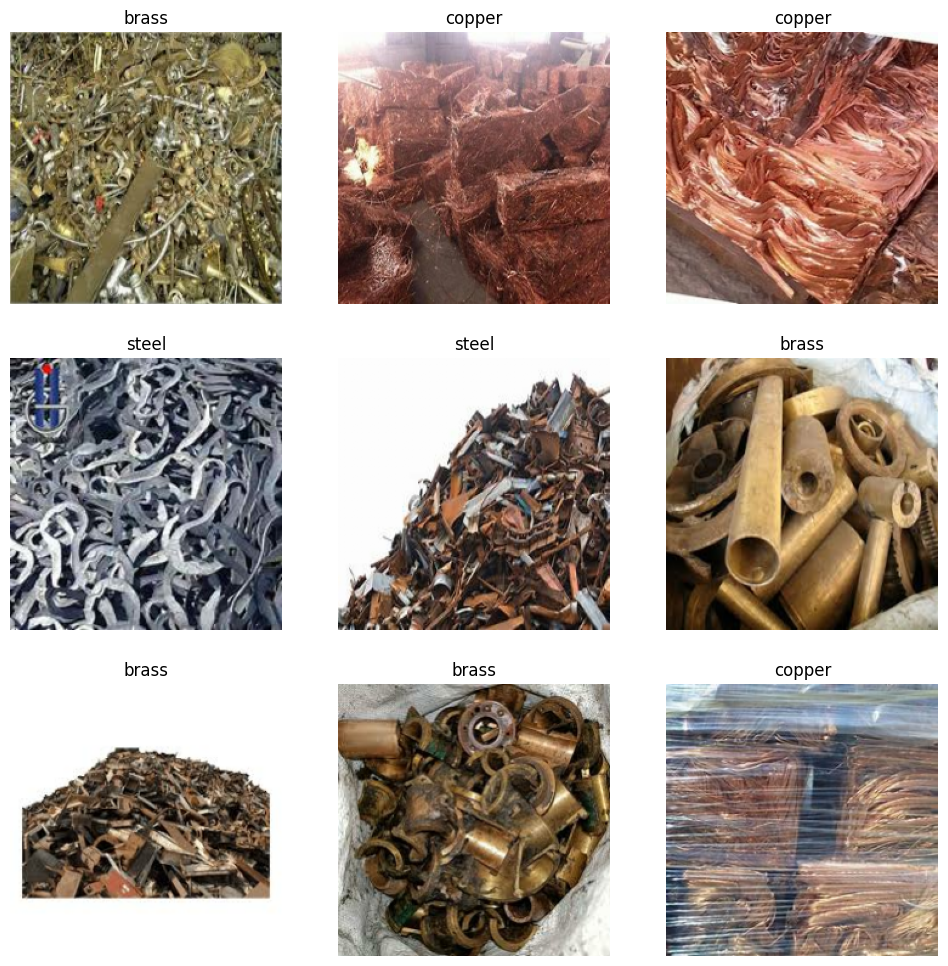

In [ ]:
print('Images before augmentation: ')
plt.figure(figsize=(12, 12))
for images, labels in train_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = images[i].numpy()
        plt.imshow(augmented_image)

        label = int(np.argmax(labels[i].numpy())) if labels[i].numpy().ndim > 0 else int(labels[i].numpy())

        plt.title(class_names[label])
        plt.axis("off")
plt.show()

Images after augmentation: 


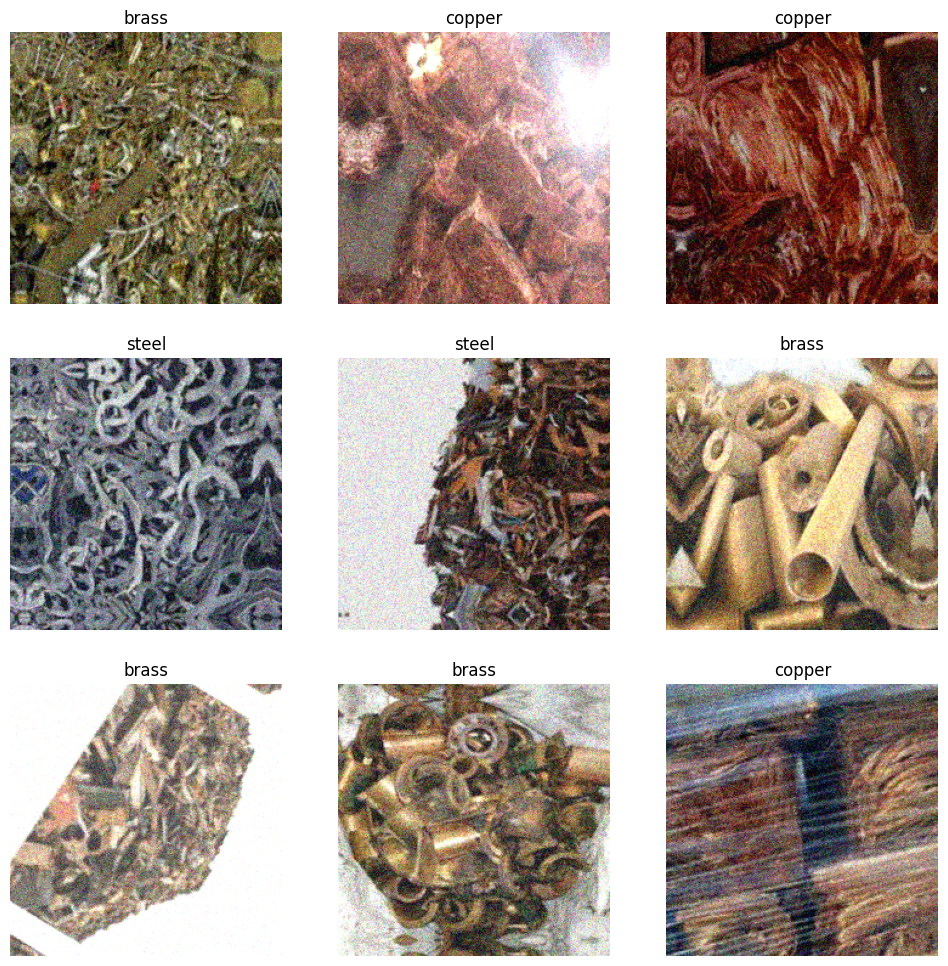

In [ ]:
print('Images after augmentation: ')
plt.figure(figsize=(12, 12))
for images, labels in train_dataset_augmented.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = images[i].numpy()
        plt.imshow(augmented_image)

        label = int(np.argmax(labels[i].numpy())) if labels[i].numpy().ndim > 0 else int(labels[i].numpy())

        plt.title(class_names[label])
        plt.axis("off")
plt.show()

In [ ]:
from tensorflow.keras import layers, models

model = models.Sequential()

# First Conv Block
model.add(layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(img_height, img_width, 3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2,2)))

# Second Conv Block
model.add(layers.Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2,2)))

# Third Conv Block
model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2,2)))

# Fourth Conv Block
model.add(layers.Conv2D(256, (3,3), activation='relu', padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2,2)))

# Fully Connected Layers
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(len(class_names), activation='softmax'))

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_24 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_24 (MaxPooling2D)      │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_25               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_25 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_26               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_26 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_27               │ (None, 28, 28, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_27 (MaxPooling2D)      │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 512)                 │      25,690,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,213,316 (100.00 MB)

 Trainable params: 26,212,356 (99.99 MB)

 Non-trainable params: 960 (3.75 KB)

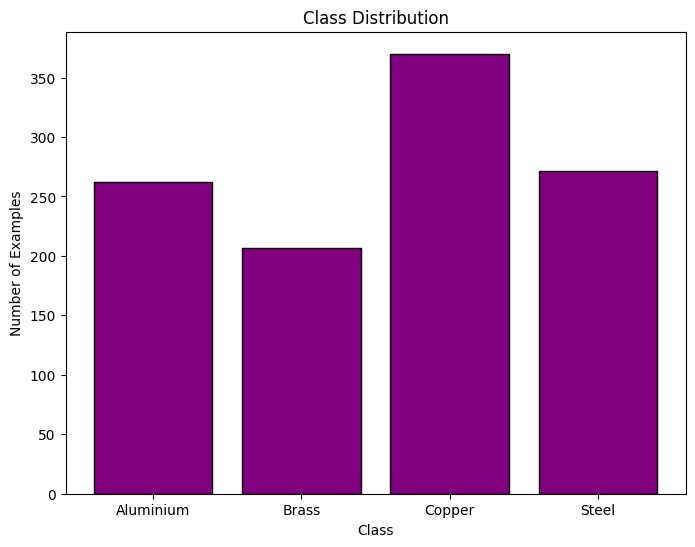

In [ ]:
import matplotlib.pyplot as plt

class_names = ['Aluminium', 'Brass', 'Copper', 'Steel']
class_counts = [262, 207, 370, 271]

plt.figure(figsize=(8, 6))
plt.bar(class_names, class_counts, color='purple', edgecolor='black')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Examples')

# Show plot
plt.show()

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.arange(len(class_names)), y=np.argmax(train_labels, axis=1))
class_weights_dict = dict(enumerate(class_weights))

print("Class Weights:", class_weights_dict)

Class Weights: {0: 1.0584291187739463, 1: 1.3608374384236452, 2: 0.7466216216216216, 3: 1.0193726937269372}


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)
]

history = model.fit(
    train_dataset,
    epochs=26,
    validation_data=test_dataset,
    class_weight=class_weights_dict,
)

Epoch 1/26
35/35 ━━━━━━━━━━━━━━━━━━━━ 17s 268ms/step - accuracy: 0.4836 - loss: 3.4817 - val_accuracy: 0.2326 - val_loss: 2.8902
Epoch 2/26
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6577 - loss: 1.9915 - val_accuracy: 0.5349 - val_loss: 4.2876
Epoch 3/26
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7030 - loss: 1.0611 - val_accuracy: 0.4884 - val_loss: 5.5671
Epoch 4/26
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7281 - loss: 0.8157 - val_accuracy: 0.5000 - val_loss: 5.3240
Epoch 5/26
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7656 - loss: 0.6835 - val_accuracy: 0.5116 - val_loss: 3.7849
Epoch 6/26
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8143 - loss: 0.5566 - val_accuracy: 0.6395 - val_loss: 1.5123
Epoch 7/26
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7898 - loss: 0.5963 - val_accuracy: 0.5814 - val_loss: 1.8865
Epoch 8/26
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.8542 - loss: 0.4472 - val_accuracy: 0.6744 -

In [ ]:
test_loss, test_acc = model.evaluate(test_dataset)
print(f"Test Accuracy: {test_acc * 100:.2f}%")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9708 - loss: 0.1204 
Test Accuracy: 96.51%


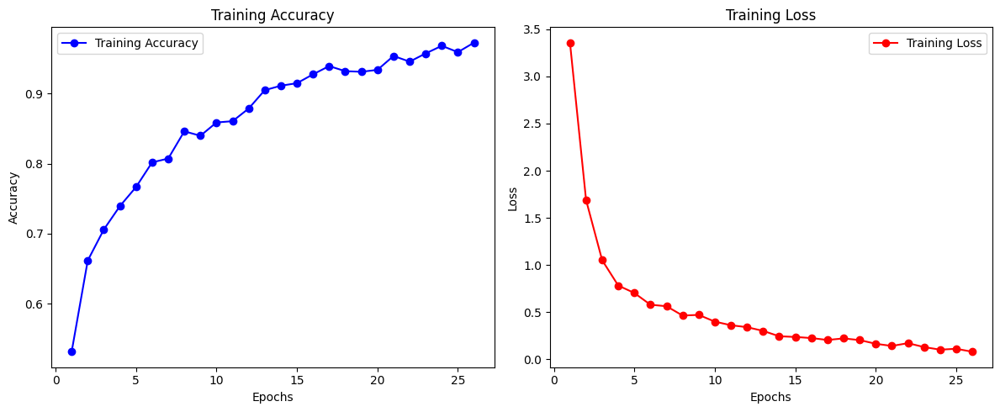

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
loss = history.history['loss']
epochs = range(1, len(acc) + 1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
plt.title('Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'ro-', label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step


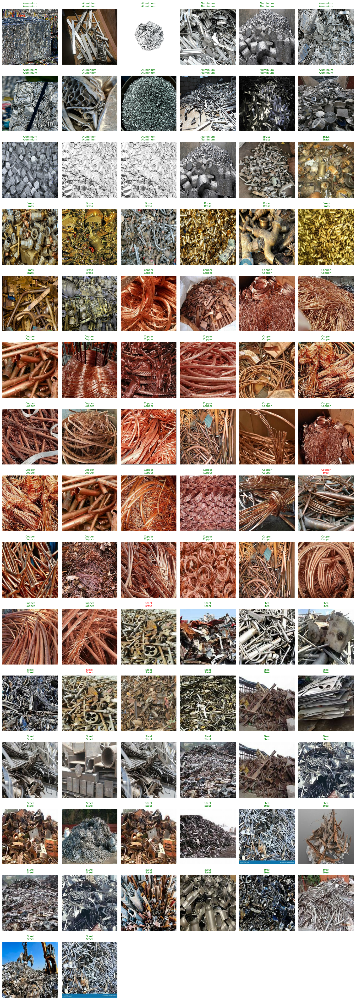

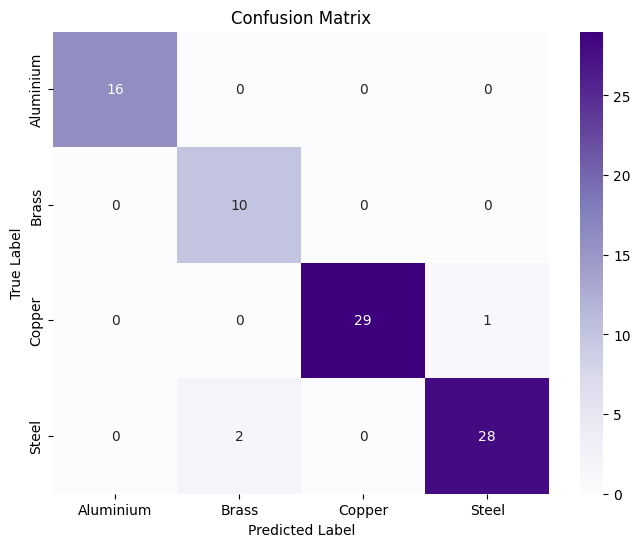

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix

def visualize_results_and_confusion_matrix(model, dataset, class_names):
    images, true_labels = [], []

    for img, label in dataset.unbatch():
        images.append(img)
        true_labels.append(np.argmax(label))

    images = np.array(images)
    true_labels = np.array(true_labels)

    pred_probs = model.predict(images)
    pred_labels = np.argmax(pred_probs, axis=1)

    num_images = len(images)
    plt.figure(figsize=(15, num_images // 6 * 3))

    for i in range(num_images):
        plt.subplot(num_images // 6 + 1, 6, i + 1)
        plt.imshow(images[i])
        true_class = class_names[true_labels[i]]
        pred_class = class_names[pred_labels[i]]
        color = 'green' if true_class == pred_class else 'red'
        plt.title(f"{true_class}\n{pred_class}", color=color, fontsize=8)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    cm = confusion_matrix(true_labels, pred_labels)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

visualize_results_and_confusion_matrix(model, test_dataset, class_names)